# Universidade Estadual de Campinas Instituto de Computação
## Introdução ao Processamento Digital de Imagem (MC920 / MO443) 
## Professor: Hélio Pedrini
## Trabalho 2 - 1S2023

### Aluno: Maurício Pereira Lopes - RA 225242
---------------------------------

#### 1 Especificação do Problema
O propósito deste trabalho é realizar experimentos com métodos de limiarização global e local em imagens monocromáticas. Métodos de limiarização global determinam um único valor de limiar para toda a imagem. Por outro lado, métodos de limiarização adaptativa local calculam um limiar para cada pixel da imagem com base na informação contida em uma vizinhança do pixel. Em ambos os casos, se um pixel p(x, y) na imagem de entrada possuir um valor mais alto que o limiar, então o pixel p(x, y) é classificado como objeto (preto), caso contrário, ele é rotulado como fundo (branco).
Implemente métodos de limiarização global e local, conforme descrição abaixo, aplicando-os à imagem de entrada.

Fonte das imagens: https://www.ic.unicamp.br/~helio/imagens_pgm/

---

In [2]:
# carregamento de bibliotecas
# !pip install pgm_reader
# !pip install opencv-python
# !pip install img2bw

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os
import time

In [3]:
# leitura das imagens: todas as imagens serão salvas em um dicionário
# de forma a poderem ser chamadas diretamente quando necessário
path = "./data/"

images = {}
for file_name in os.listdir("./data/"):
    images[file_name] = cv2.imread(path + file_name, -1)

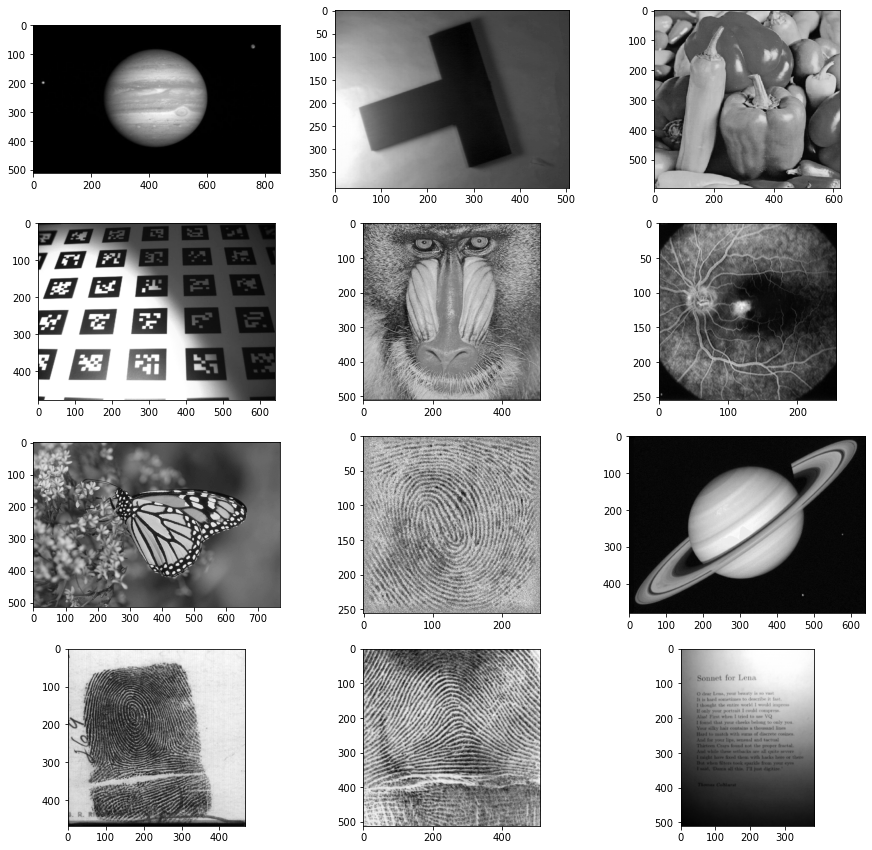

In [10]:
# plot de todas as imagens usadas no trabalho

fig, axs = plt.subplots(4, 3, figsize=(15, 15))
#fig.suptitle('Imagens utilizadas no trabalho')
k = 0
for l in range(4):
    for c in range(3):
        if k < 12:
            axs[l][c].imshow(images[list(images.keys())[k]], cmap='gray')
        k = k + 1
plt.savefig("/Users/mauriciopereiralopes/Library/Mobile Documents/com~apple~CloudDocs/unicamp/MO443-trabalho2/relatorio/figura1.jpg")
plt.show()  

---
Método Global: se o valor de intensidade de um pixel (x, y) for maior do que um limiar T (por exemplo, T = 128), o pixel será considerado como pertencente ao objeto; caso contrário, será considerado como fundo.

In [4]:
# função para calcula o limiar T global usando as médias das intensidades
# de cada região a cada interação e um delta_T informado

def limiar_T(image, delta_T):
    # entradas:
    #   image: imagem em tons de cinza
    #   delta_T: um valor usado como critério de convergência
    #            para o melhor valor de T
    # saída:
    #   t_next: valor encontrado para o limiar T
    
    t = 100
    t_next = 110
    while (t_next - t)**2 >= delta_T**2:
        binary_mask = image < t_next
        r1_mean = (image * binary_mask).sum() / binary_mask.sum()
        r2_mean = (image * np.invert(binary_mask)).sum() / np.invert(binary_mask).sum()
        t = np.copy(t_next)
        t_next = (r1_mean + r2_mean) / 2

    return t_next

In [5]:
# função para plotar o histograma de uma imagem
# com o limiar T se ele for fornecido

def histograma(image, T = -1):
    hist, bin = np.histogram(image.ravel(),256,[0,255])
    plt.xlim([0,255])
    plt.plot(hist)
    if T != -1:
        plt.axvline(x = T, color = 'r')
    plt.title('histogram')

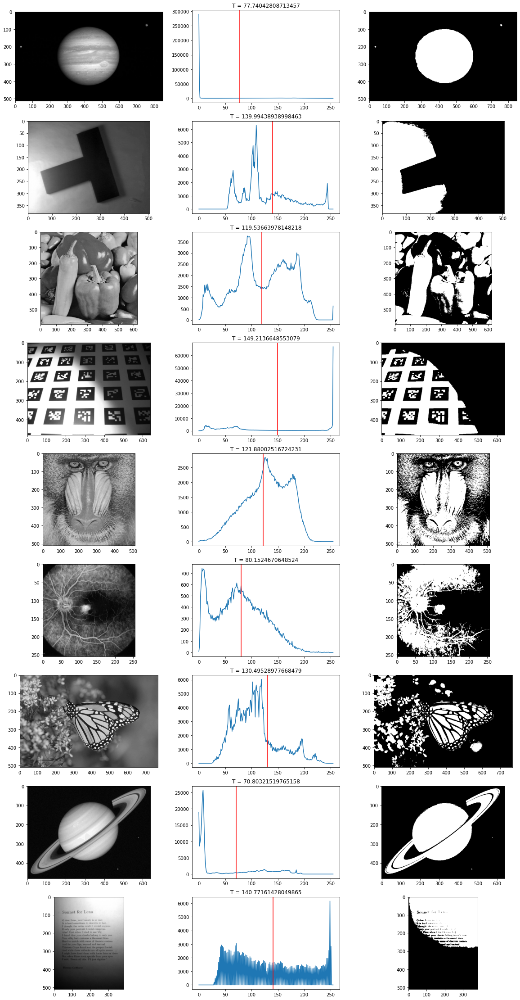

In [6]:
rows = len(list(os.listdir("./data/")))
fig, axs = plt.subplots(rows, 3, figsize=(20, 40))

r = 0
for img_name in list(images.keys()):
    image = images[img_name]
    T = limiar_T(image, 0.01)
    binary_mask = image > T
    hist, bin = np.histogram(image.ravel(),256,[0,255])
    axs[r][0].imshow(image, cmap = "gray")
    axs[r][1].plot(hist)
    label = "T = " + str(T)
    axs[r][1].title.set_text(label)
    axs[r][1].axvline(x = T, color = 'r')
    axs[r][2].imshow(binary_mask, cmap='gray')
    r = r + 1

---
Método de Otsu: calcula automaticamente um limiar ótimo para dividir a imagem em duas classes de pixels por meio da minimização da variância intraclasse.

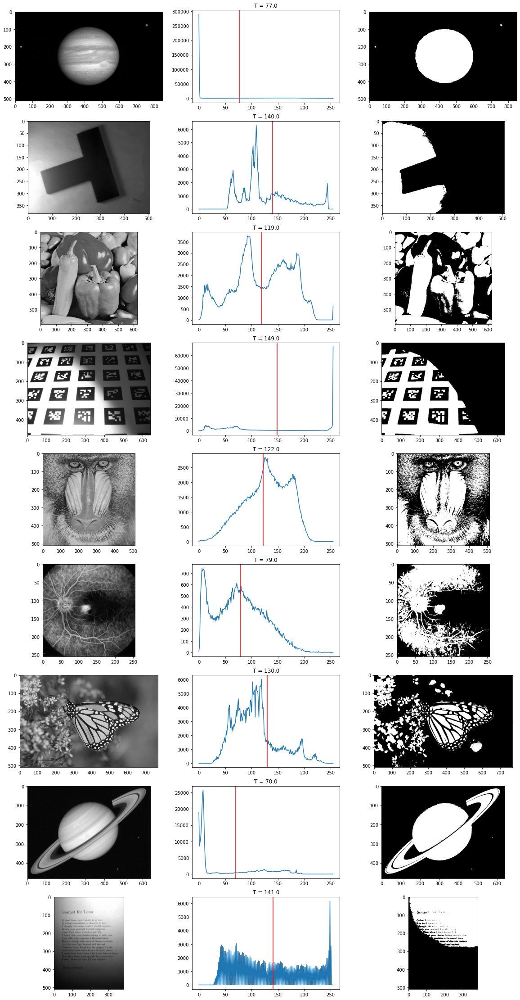

In [7]:
rows = len(list(os.listdir("./data/")))
fig, axs = plt.subplots(rows, 3, figsize=(20, 40))

r = 0
for img_name in list(images.keys()):
    image = images[img_name]
    T = cv2.threshold(image,0,255,cv2.THRESH_BINARY + cv2.THRESH_OTSU)[0]
    binary_mask = image > T
    hist, bin = np.histogram(image.ravel(),256,[0,255])
    axs[r][0].imshow(image, cmap = "gray")
    axs[r][1].plot(hist)
    label = "T = " + str(T)
    axs[r][1].title.set_text(label)    
    axs[r][1].axvline(x = T, color = 'r')
    axs[r][2].imshow(binary_mask, cmap='gray')
    r = r + 1

---
Método de Bernsen: para cada pixel (x, y), o limiar é calculado como

> T(x,y) = (zmin +zmax) / 2

em que zmin e zmax são os valores de níveis de cinza mínimo e máximo, respectivamente, em uma vizinhança n × n centrada em (x, y).

In [8]:
# função para gerar imagem binarizada pelo método de Bernsen

def bernsen(img, n = 5):
    '''
    Binarize an input grayscale image using the Bernsen method.

    Parameters:
    - img: Input grayscale image.
    - n: Size of the local window/kernel for computing the local zmax and zmin.

    Returns:
    - Binary thresholded image.
    '''
    # definição do kernel de dimensões n x n com o valor do
    # pixel central igual a zero e os demais valores iguais a 1
    kernel = np.ones((n, n))
    center_idx = n // 2
    kernel[center_idx, center_idx] = 0

    # gerar uma imagem  com padding refletindo os valores
    # internos da imagem para o pad
    pad_size = center_idx
    img_pad = np.pad(image, pad_size, mode = "reflect")

    # cria uma nova imagem com todos os valores dos pixels em 1
    new_img = np.ones(image.shape)

    # varrer a imagem com pad usando o kernel de forma a poder
    # encontrar o valor máximo e mínimo dos pixels da imagem sobreposta
    # pelo kernel.
    # depois calcúla-se o T local e se aplica o valor 255 para o pixel
    # central caso seu valor original seja maior que T e zero caso contrário
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            z_max = np.max(img_pad[i:kernel.shape[0]+i, j:kernel.shape[1]+j] * kernel)
            z_min = np.min(img_pad[i:kernel.shape[0]+i, j:kernel.shape[1]+j] * kernel)
            if image[i, j] > (z_max + z_min) / 2:
                new_img[i, j] = 255
            else:
                new_img[i, j] = 0
    
    return new_img

Time = 689.6642601490021


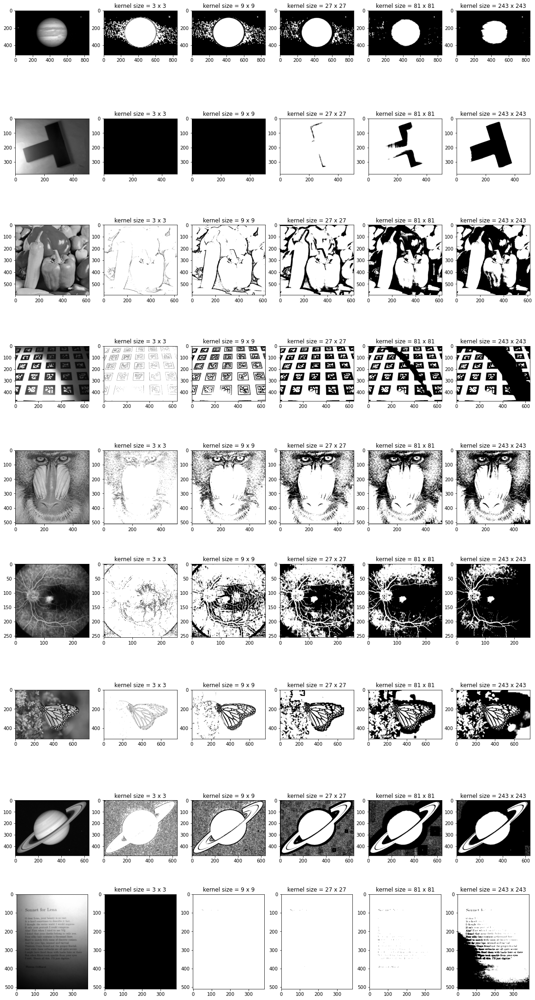

In [81]:
# fazer um grid search para vários valores de n em uma imagem
# a escolha do melhor n será baseada na avaliação visual da imagem binarizada
start = time.time()

n_search = [3, 9, 27, 81, 243]

rows = len(list(os.listdir("./data/")))
fig, axs = plt.subplots(rows, len(n_search) + 1, figsize=(20, 40))
r = 0
for img_name in list(images.keys()):
    image = images[img_name]
    c = 0
    axs[r][c].imshow(image, cmap = "gray")
    for n in n_search:
        new_img = bernsen(image, n)
        axs[r][c + 1].imshow(new_img, cmap = "gray")
        label = "kernel size = " + str(n) + " x " + str(n)
        axs[r][c + 1].title.set_text(label)
        c = c + 1
    r = r + 1 

end = time.time()

print("Time =", end - start)

---
Método de Niblack: o valor de limiar é baseado na média local e no desvio padrão. O valor de limiar em um pixel (x, y) é calculado como

> T (x, y) = μ(x, y) + k σ(x, y)

em que μ(x, y) e σ(x, y) são a média e o desvio padrão, respectivamente, em uma vizinhança local de (x, y). O tamanho da vizinhança deveria ser suficientemente pequeno para preservar detalhes locais, mas, ao mesmo tempo, suficientemente grande para suprimir ruído. O valor de k é usado para ajustar a fração da borda do objeto a ser considerada como parte do objeto.

In [10]:
# função para gerar imagem binarizada pelo método de Niblack

def niblack(img, n = 5, k = 1):
    '''
    Binarize an input grayscale image using the Niblack method.

    Parameters:
    - img: Input grayscale image.
    - n: Size of the local window/kernel for computing the local zmax and zmin.
    - k: factor to multiply the local standard deviation. Impacts the portion of
        the object's edge to be considered as part of the segmented object.

    Returns:
    - Binary thresholded image.
    '''
    # definição do kernel de dimensões n x n com o valor do
    # pixel central igual a zero e os demais valores iguais a 1
    kernel = np.ones((n, n))
    center_idx = n // 2
    kernel[center_idx, center_idx] = 0

    # gerar uma imagem  com padding refletindo os valores
    # internos da imagem para o pad
    pad_size = center_idx
    img_pad = np.pad(image, pad_size, mode = "reflect")

    # cria uma nova imagem com todos os valores dos pixels em 1
    new_img = np.ones(image.shape)

    # varrer a imagem com pad usando o kernel de forma a poder
    # encontrar a média e o desvio padrão locais da imagem sobreposta
    # pelo kernel.
    # depois calcúla-se o T local e se aplica o valor 255 para o pixel
    # central caso seu valor original seja maior que T e zero caso contrário
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            mean = np.sum(img_pad[i:kernel.shape[0]+i, j:kernel.shape[1]+j] * kernel) / (n * n)
            sigma = np.std(img_pad[i:kernel.shape[0]+i, j:kernel.shape[1]+j] * kernel)
            if image[i, j] > (mean + k * sigma):
                new_img[i, j] = 255
            else:
                new_img[i, j] = 0
    
    return new_img

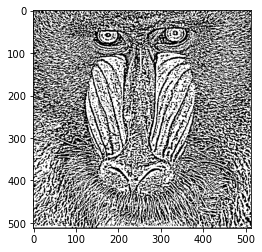

In [11]:
n = 9
k = 0
image = images["baboon.pgm"]
new_img = niblack(image, n, k)
plt.imshow(new_img, cmap = "gray")
plt.show()

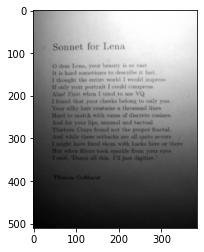

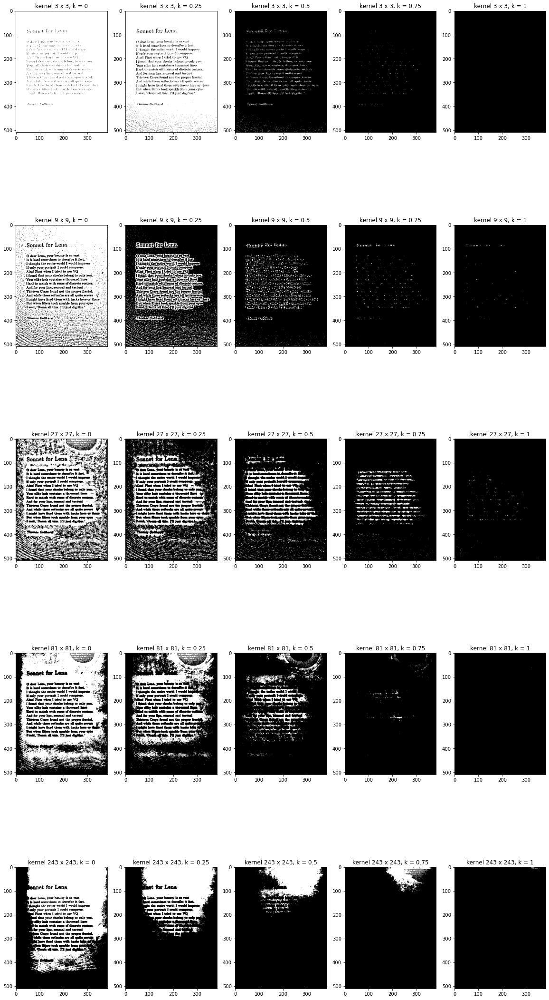

In [12]:
# fazer um grid search para vários valores de n e k em uma imagem
# a escolha do melhor n e k será baseada na avaliação visual da imagem binarizada

n_search = [3, 9, 27, 81, 243]
k_search = [0, 0.25, 0.5, 0.75, 1]
image = image = images["sonnet.pgm"]
plt.imshow(image, cmap = "gray")
plt.show()

rows = len(n_search)
fig, axs = plt.subplots(rows, len(k_search), figsize=(20, 40))
r = 0

for n in n_search:
    c = 0
    for k in k_search:
        new_img = niblack(image, n, k)
        axs[r][c].imshow(new_img, cmap = "gray")
        label = "kernel " + str(n) + " x " + str(n) + ", k = " + str(k)
        axs[r][c].title.set_text(label)
        c = c + 1
    r = r + 1 

---
Método de Sauvola e Pietaksinen: procura melhorar os resultados do método de Niblack, particularmente para imagens de documentos apresentando má-iluminação. O limiar se adapta de acordo com a média local e o desvio padrão sobre uma janela de tamanho n × n pixels. O limiar em um pixel (x, y) é calculado como

> T(x,y) = μ(x,y) * {1 + k * {[σ(x,y) / R] - 1}

em que μ(x,y) e σ(x,y) são definidos como em Niblack. Sauvola e Pietaksinen sugerem valores de k = 0.5 e R = 128.

In [13]:
# função para gerar imagem binarizada pelo método de Sauvola e Pietaksinen

def sauvola(img, n = 5, k = 0.5, R = 128):
    '''
    Binarize an input grayscale image using the Sauvola and Pietaksinen method.

    Parameters:
    - img: Input grayscale image.
    - n: Size of the local window/kernel for computing the local zmax and zmin.
    - k: factor to multiply the local standard deviation.
    - R: 

    Returns:
    - Binary thresholded image.
    '''
    # definição do kernel de dimensões n x n com o valor do
    # pixel central igual a zero e os demais valores iguais a 1
    kernel = np.ones((n, n))
    center_idx = n // 2
    kernel[center_idx, center_idx] = 0

    # gerar uma imagem  com padding refletindo os valores
    # internos da imagem para o pad
    pad_size = center_idx
    img_pad = np.pad(image, pad_size, mode = "reflect")

    # cria uma nova imagem com todos os valores dos pixels em 1
    new_img = np.ones(image.shape)

    # varrer a imagem com pad usando o kernel de forma a poder
    # encontrar a média e o desvio padrão locais da imagem sobreposta
    # pelo kernel.
    # depois calcúla-se o T local e se aplica o valor 255 para o pixel
    # central caso seu valor original seja maior que T e zero caso contrário
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            mean = np.sum(img_pad[i:kernel.shape[0]+i, j:kernel.shape[1]+j] * kernel) / (n * n)
            sigma = np.std(img_pad[i:kernel.shape[0]+i, j:kernel.shape[1]+j] * kernel)
            T = mean * (1 + k * ((sigma / R) -1))
            if image[i, j] > T:
                new_img[i, j] = 255
            else:
                new_img[i, j] = 0
    
    return new_img

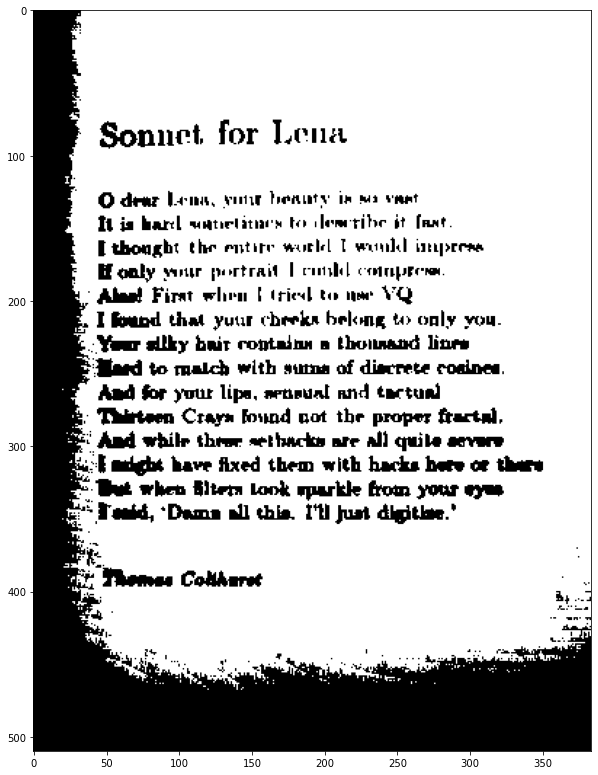

In [14]:
n = 243
k = 0.1
R = 128
image = images["sonnet.pgm"]
new_img = sauvola(image, n, k, R)
fig, axs = plt.subplots(figsize=(10, 20))
plt.imshow(new_img, cmap = "gray")
plt.show()

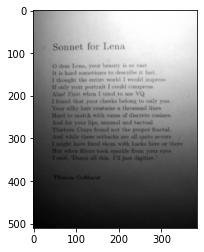

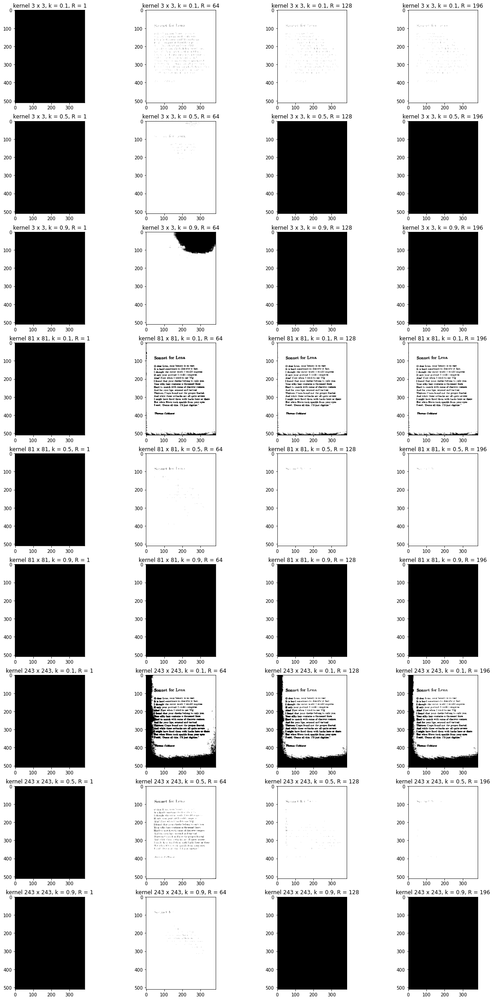

In [15]:
# fazer um grid search para vários valores de n, k e R em uma imagem
# a escolha do melhor n, k e R será baseada na avaliação visual da imagem binarizada

n_search = [3, 81, 243]
k_search = [0.1, 0.5, 0.9]
R_search = [1, 64, 128, 196]
image = image = images["sonnet.pgm"]
plt.imshow(image, cmap = "gray")
plt.show()

rows = len(n_search) * len(k_search)
fig, axs = plt.subplots(rows, len(R_search), figsize=(20, 40))

r = 0
for n in n_search:
    for k in k_search:
        c = 0
        for R in R_search:
            new_img = sauvola(image, n, k, R)
            axs[r][c].imshow(new_img, cmap = "gray")
            label = "kernel " + str(n) + " x " + str(n) + ", k = " + str(k) + ", R = " + str(R)
            axs[r][c].title.set_text(label)
            c = c + 1
        r = r + 1 

---
Método de Phansalskar, More e Sabale: variação do método anterior para lidar com imagens de baixo contraste. O limiar é calculado como

> T = μ(x,y) * {1 + p exp(-q * μ(x,y)) + k * {[σ(x,y) / R] - 1}}

em que μ(x, y) e σ(x, y) são a média e o desvio padrão, respectivamente, em uma vizinhança local de (x, y). Os autores sugerem k = 0.25, R = 0.5, p = 2 e q = 10. Qualquer outro valor numérico diferente de 0 é válido para k. O valor de R é diferente do método anterior, pois usa uma intensidade normalizada da imagem.

In [18]:
# função para gerar imagem binarizada pelo método de Phansalskar, More e Sabale

def phamosa(img, n = 5, k = 0.25, R = 0.5, p = 2, q = 10):
    '''
    Binarize an input grayscale image using the Phansalskar, More and Sabale method.

    Parameters:
    - img: Input grayscale image.
    - n: Size of the local window/kernel for computing the local zmax and zmin.
    - k: factor to multiply the local standard deviation.
    - R: 
    - p:
    - q:

    Returns:
    - Binary thresholded image.
    '''
    # definição do kernel de dimensões n x n com o valor do
    # pixel central igual a zero e os demais valores iguais a 1
    kernel = np.ones((n, n))
    center_idx = n // 2
    kernel[center_idx, center_idx] = 0

    # gerar uma imagem  com padding refletindo os valores
    # internos da imagem para o pad
    pad_size = center_idx
    img_pad = np.pad(image, pad_size, mode = "reflect")

    # cria uma nova imagem com todos os valores dos pixels em 1
    new_img = np.ones(image.shape)

    # varrer a imagem com pad usando o kernel de forma a poder
    # encontrar a média e o desvio padrão locais da imagem sobreposta
    # pelo kernel.
    # depois calcula-se o T local e se aplica o valor 255 para o pixel
    # central caso seu valor original seja maior que T e zero caso contrário
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            mean = np.mean(img_pad[i:kernel.shape[0]+i, j:kernel.shape[1]+j] * kernel)
            sigma = np.std(img_pad[i:kernel.shape[0]+i, j:kernel.shape[1]+j] * kernel)
            T = mean * (1 + (p * np.exp(-q * mean)) + (k * ((sigma / R) - 1)))
            #T = mean * (1 + p * exp(-q*img_mean) + k * ((stdev/r) - 1)
            if image[i, j] > T:
                new_img[i, j] = 255
            else:
                new_img[i, j] = 0
    
    return new_img

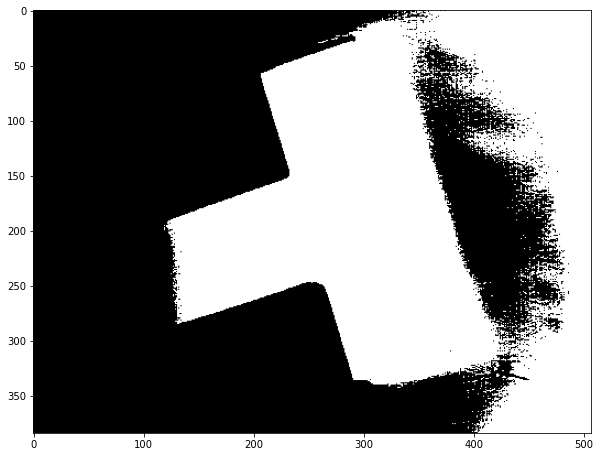

In [23]:
n = 7
k = 0.9
R = 15
p = 2
q = 10

image = images["wedge.pgm"]
new_img = phamosa(image, n, k, R, p, q)
fig, axs = plt.subplots(figsize=(10, 20))
plt.imshow(new_img, cmap = "gray")
plt.show()

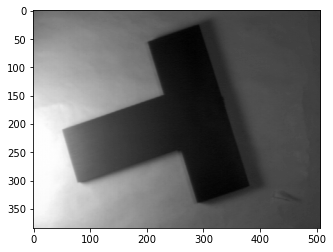

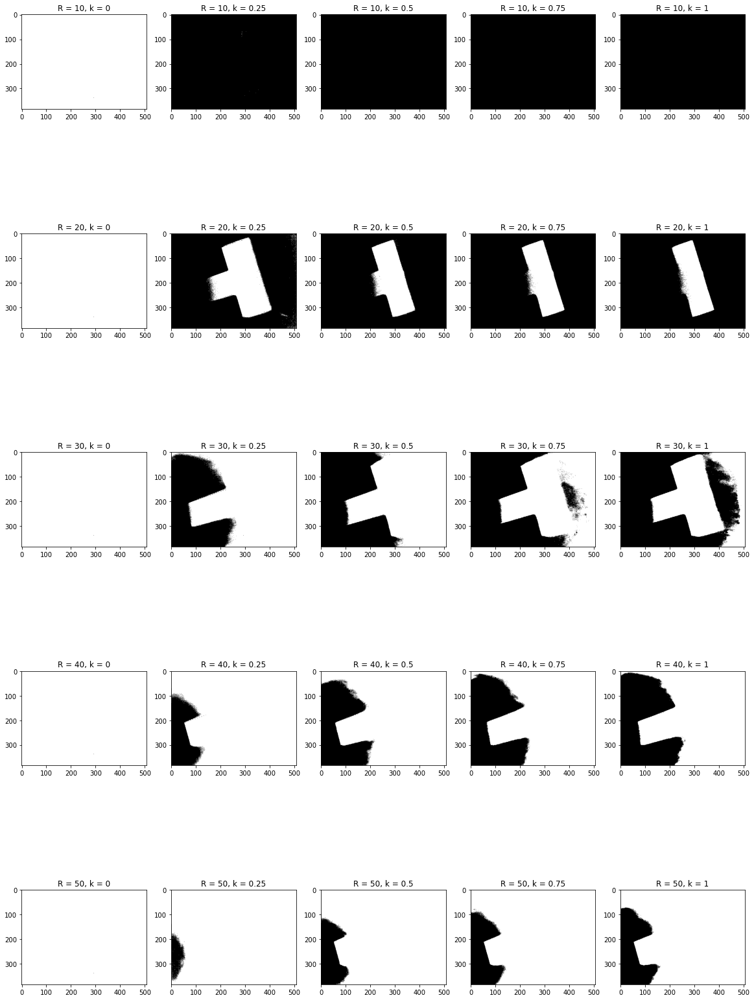

In [30]:
# fazer um grid search para vários valores de n, k, R, p e q em uma imagem
# a escolha do melhor n, k, R, p e q será baseada na avaliação visual da imagem binarizada

# n_search = [3, 9, 27, 81, 243]
k_search = [0, 0.25, 0.5, 0.75, 1]
R_search = [10, 20, 30, 40, 50]
image = image = images["wedge.pgm"]
plt.imshow(image, cmap = "gray")
plt.show()

rows = len(R_search)
fig, axs = plt.subplots(rows, len(k_search), figsize=(20, 30))
r = 0

for R in R_search:
    c = 0
    for k in k_search:
        new_img = phamosa(image, n = 3, k = k, R = R)
        axs[r][c].imshow(new_img, cmap = "gray")
        # label = "kernel " + str(n) + " x " + str(n) + ", k = " + str(k)
        label = "R = " + str(R) + ", k = " + str(k)
        axs[r][c].title.set_text(label)
        c = c + 1
    r = r + 1 

---
Método do Contraste: atribui o valor de um pixel como fundo ou objeto, dependendo se seu valor está mais práximo do máximo ou mínimo local, respectivamente.

In [33]:
# função para gerar imagem binarizada pelo método do Contraste

def contrast(img, n = 5):
    '''
    Binarize an input grayscale image using the contrast method.

    Parameters:
    - img: Input grayscale image.
    - n: Size of the local window/kernel for computing the local zmax and zmin.

    Returns:
    - Binary thresholded image.
    '''
    # definição do kernel de dimensões n x n com o valor do
    # pixel central igual a zero e os demais valores iguais a 1
    kernel = np.ones((n, n))
    center_idx = n // 2
    kernel[center_idx, center_idx] = 0

    # gerar uma imagem  com padding refletindo os valores
    # internos da imagem para o pad
    pad_size = center_idx
    img_pad = np.pad(image, pad_size, mode = "reflect")

    # cria uma nova imagem com todos os valores dos pixels em 1
    new_img = np.ones(image.shape)

    # varrer a imagem com pad usando o kernel de forma a poder
    # encontrar o máximo e mínimo locais da imagem sobreposta
    # pelo kernel.
    # depois compara a distância do valor do pixel ao valor máximo local com
    # com a distância do valor do pixel ao mínimo local e atribui ao pixel ser
    # objeto se o pixel estiver mais próximo do máximo e fundo se estiver mais próximo do mínimo
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            z_max = np.max(img_pad[i:kernel.shape[0]+i, j:kernel.shape[1]+j] * kernel)
            z_min = np.min(img_pad[i:kernel.shape[0]+i, j:kernel.shape[1]+j] * kernel)
            if z_max - image[i, j] < image[i, j] - z_min:
                new_img[i, j] = 255
            else:
                new_img[i, j] = 0
    
    return new_img

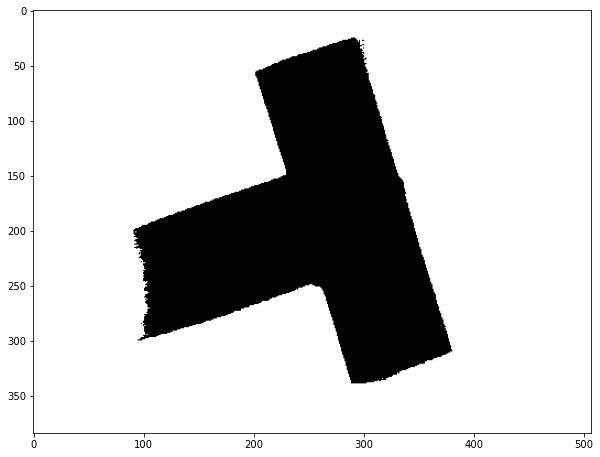

In [40]:
n = 243

image = images["wedge.pgm"]
new_img = contrast(image, n)
fig, axs = plt.subplots(figsize=(10, 20))
plt.imshow(new_img, cmap = "gray")
plt.show()

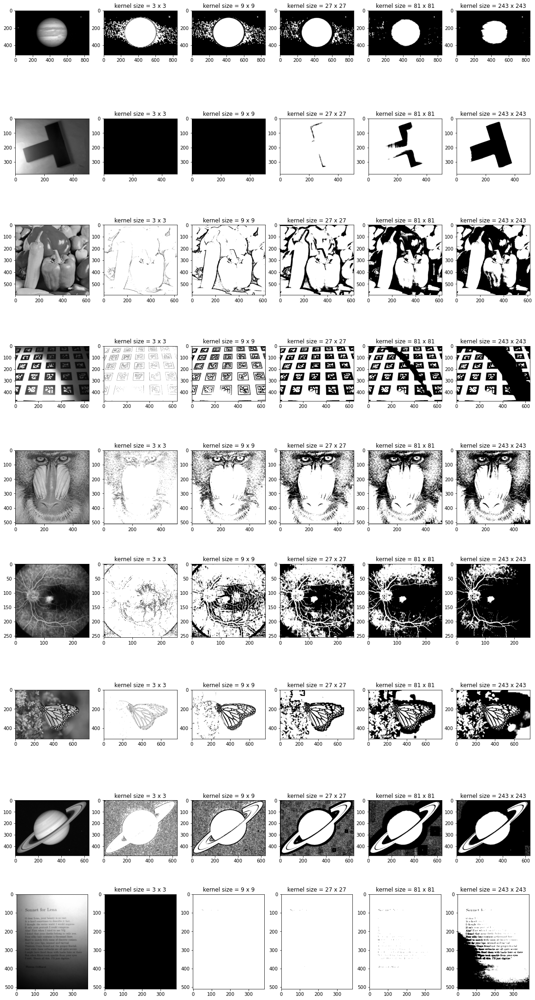

In [41]:
# fazer um grid search para vários valores de n em uma imagem
# a escolha do melhor n será baseada na avaliação visual da imagem binarizada

n_search = [3, 9, 27, 81, 243]

rows = len(list(os.listdir("./data/")))
fig, axs = plt.subplots(rows, len(n_search) + 1, figsize=(20, 40))
r = 0
for img_name in list(images.keys()):
    image = images[img_name]
    c = 0
    axs[r][c].imshow(image, cmap = "gray")
    for n in n_search:
        new_img = contrast(image, n)
        axs[r][c + 1].imshow(new_img, cmap = "gray")
        label = "kernel size = " + str(n) + " x " + str(n)
        axs[r][c + 1].title.set_text(label)
        c = c + 1
    r = r + 1 

---
Método da Média: seleciona o limiar como a média da distribuição local de intensidade calculada no interior de uma vizinhança. A média é então subtraída de um valor constante. O limiar é calculado como

T = μ(x,y) − C

em que μ(x, y) é a média em uma vizinhança local de (x, y) e C é uma constante de ajuste do limiar. Dessa forma, se o valor de um pixel (x, y) for maior do que o limiar T , o pixel será considerado como pertencente ao objeto; caso contrário, será considerado como fundo.


In [43]:
# função para gerar imagem binarizada pelo método da Média

def local_mean(img, n = 5, c = 128):
    '''
    Binarize an input grayscale image using the local mean method.

    Parameters:
    - img: Input grayscale image.
    - n: Size of the local window/kernel for computing the local zmax and zmin.
    - c: contrast adjustment

    Returns:
    - Binary thresholded image.
    '''
    # definição do kernel de dimensões n x n com o valor do
    # pixel central igual a zero e os demais valores iguais a 1
    kernel = np.ones((n, n))
    center_idx = n // 2
    kernel[center_idx, center_idx] = 0

    # gerar uma imagem  com padding refletindo os valores
    # internos da imagem para o pad
    pad_size = center_idx
    img_pad = np.pad(image, pad_size, mode = "reflect")

    # cria uma nova imagem com todos os valores dos pixels em 1
    new_img = np.ones(image.shape)

    # varrer a imagem com pad usando o kernel de forma a poder
    # encontrar a média local da imagem sobreposta
    # pelo kernel.
    # depois calcúla-se o T local e se aplica o valor 255 para o pixel
    # central caso seu valor original seja maior que T e zero caso contrário
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            mean = np.mean(img_pad[i:kernel.shape[0]+i, j:kernel.shape[1]+j] * kernel)
            T = mean - c
            if image[i, j] > T:
                new_img[i, j] = 255
            else:
                new_img[i, j] = 0
    
    return new_img

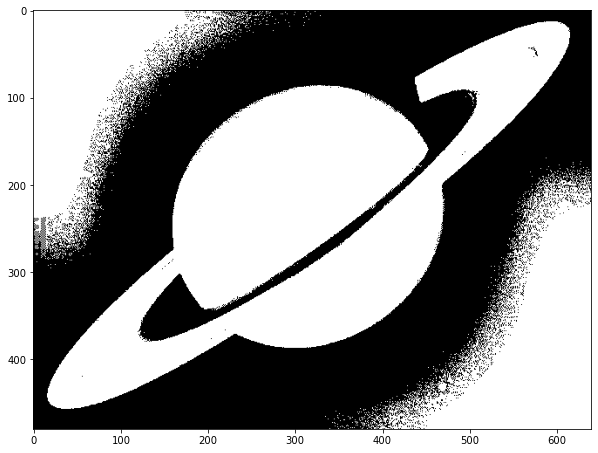

In [67]:
n = 243
c = 10

image = images["saturn.jpg"]
new_img = local_mean(image, n, c)
fig, axs = plt.subplots(figsize=(10, 20))
plt.imshow(new_img, cmap = "gray")
plt.show()

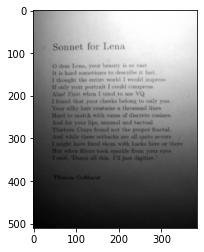

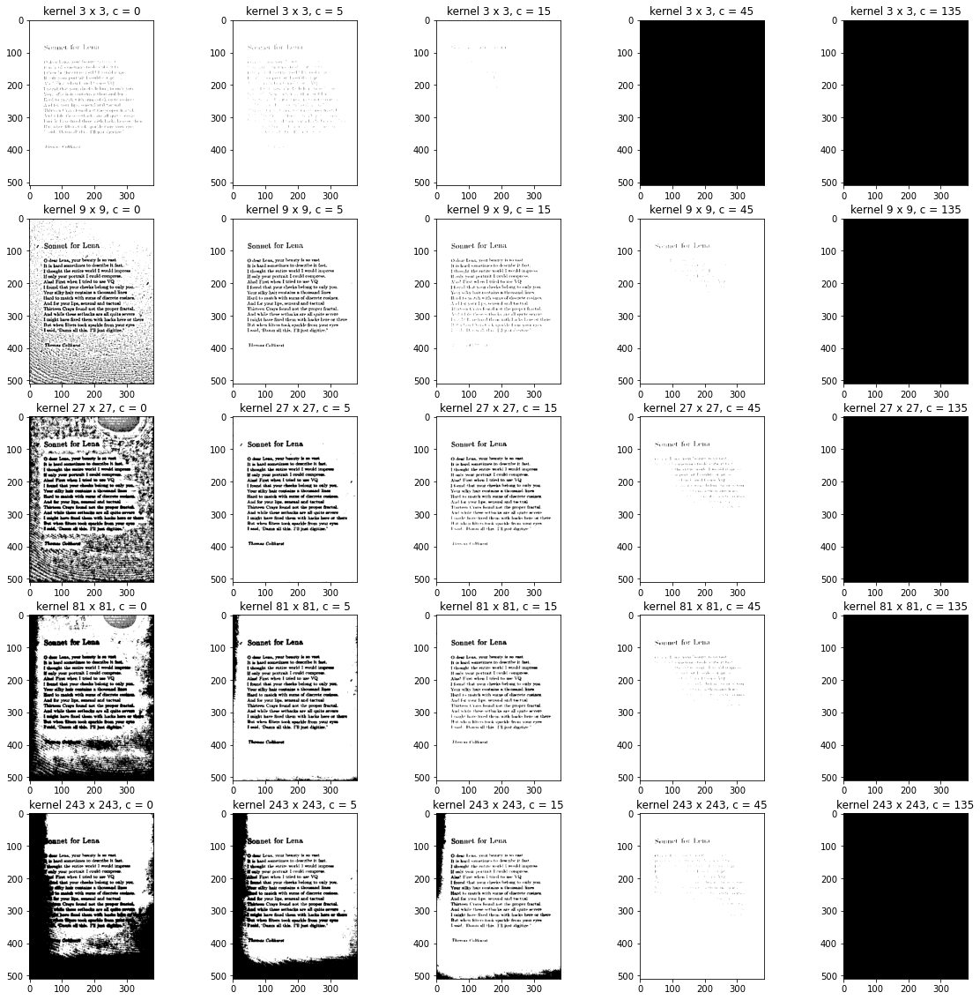

In [72]:
# fazer um grid search para vários valores de n e k em uma imagem
# a escolha do melhor n e k será baseada na avaliação visual da imagem binarizada

n_search = [3, 9, 27, 81, 243]
c_search = [0, 5, 15, 45, 135]
image = images["sonnet.pgm"]
plt.imshow(image, cmap = "gray")
plt.show()

rows = len(n_search)
fig, axs = plt.subplots(rows, len(c_search), figsize=(20, 20))
r = 0

for n in n_search:
    cont = 0
    for c in c_search:
        new_img = local_mean(image, n, c)
        axs[r][cont].imshow(new_img, cmap = "gray")
        label = "kernel " + str(n) + " x " + str(n) + ", c = " + str(c)
        axs[r][cont].title.set_text(label)
        cont = cont + 1
    r = r + 1 

---
Método da Mediana: seleciona o limiar como a mediana da distribuição local de intensidade. Dessa forma, se o valor de um pixel (x,y) for maior do que a mediana de sua vizinhança, o pixel será considerado como pertencente ao objeto; caso contrário, será considerado como fundo.

In [73]:
# função para gerar imagem binarizada pelo método da Mediana

def local_median(img, n = 5):
    '''
    Binarize an input grayscale image using the local median method.

    Parameters:
    - img: Input grayscale image.
    - n: Size of the local window/kernel for computing the local zmax and zmin.

    Returns:
    - Binary thresholded image.
    '''
    # definição do kernel de dimensões n x n com o valor do
    # pixel central igual a zero e os demais valores iguais a 1
    kernel = np.ones((n, n))
    center_idx = n // 2
    kernel[center_idx, center_idx] = 0

    # gerar uma imagem  com padding refletindo os valores
    # internos da imagem para o pad
    pad_size = center_idx
    img_pad = np.pad(image, pad_size, mode = "reflect")

    # cria uma nova imagem com todos os valores dos pixels em 1
    new_img = np.ones(image.shape)

    # varrer a imagem com pad usando o kernel de forma a poder
    # encontrar amediana local da imagem sobreposta
    # pelo kernel.
    # depois calcúla-se o T local e se aplica o valor 255 para o pixel
    # central caso seu valor original seja maior que T e zero caso contrário
    for i in range(image.shape[0]):
        for j in range(image.shape[1]):
            median = np.median(img_pad[i:kernel.shape[0]+i, j:kernel.shape[1]+j] * kernel)
            T = median
            if image[i, j] > T:
                new_img[i, j] = 255
            else:
                new_img[i, j] = 0
    
    return new_img

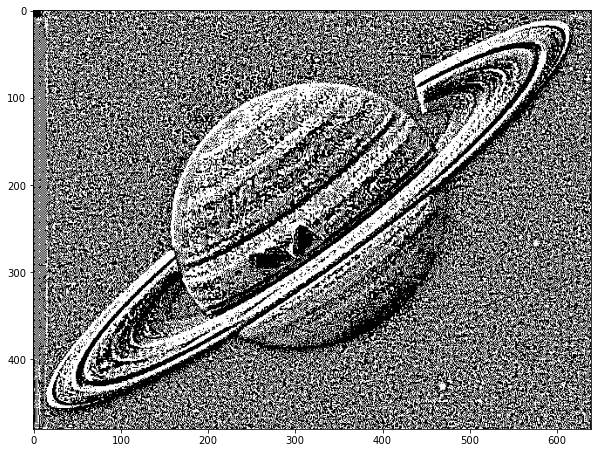

In [76]:
n = 10

image = images["saturn.jpg"]
new_img = local_median(image, n)
fig, axs = plt.subplots(figsize=(10, 20))
plt.imshow(new_img, cmap = "gray")
plt.show()

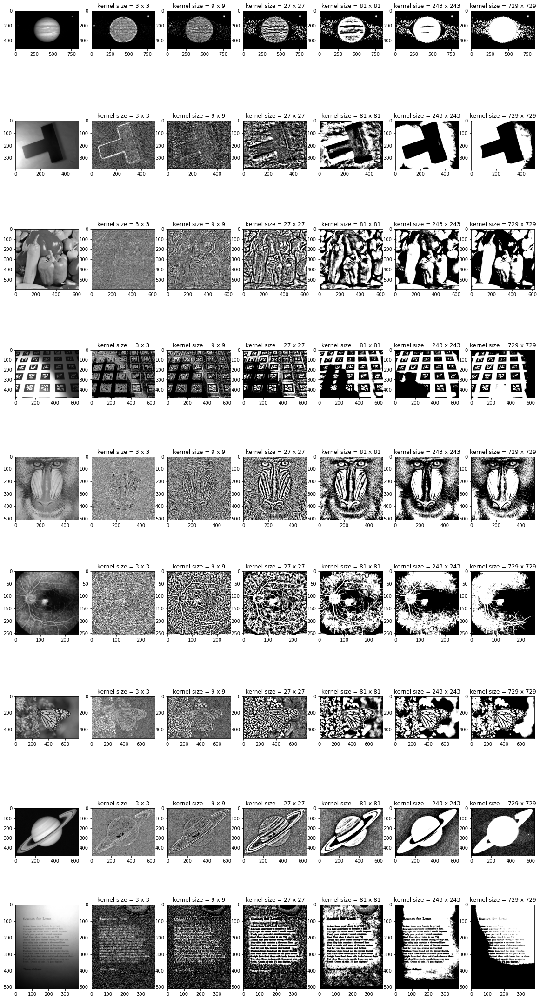

In [78]:
# fazer um grid search para vários valores de n em uma imagem
# a escolha do melhor n será baseada na avaliação visual da imagem binarizada

n_search = [3, 9, 27, 81, 243, 729]

rows = len(list(os.listdir("./data/")))
fig, axs = plt.subplots(rows, len(n_search) + 1, figsize=(20, 40))
r = 0
for img_name in list(images.keys()):
    image = images[img_name]
    c = 0
    axs[r][c].imshow(image, cmap = "gray")
    for n in n_search:
        new_img = local_median(image, n)
        axs[r][c + 1].imshow(new_img, cmap = "gray")
        label = "kernel size = " + str(n) + " x " + str(n)
        axs[r][c + 1].title.set_text(label)
        c = c + 1
    r = r + 1 